In [1]:
from notebooks.__init__ import *
%load_ext autoreload
%autoreload 2

# Load config

In [2]:
# method_overrides = ["+method/detector=sift",
#                     "+method/descriptor=disk",
#                     "+predict.evaluation.ratio_test_thr=0.99",
#                     "+predict.evaluation.estimator.inlier_thr=0.7"]
# method_overrides = ["+method/detector=superpoint",
#                     "+method/descriptor=disk",
#                     "+predict.evaluation.ratio_test_thr=0.98",
#                     "+predict.evaluation.estimator.inlier_thr=1.0"]
# method_overrides = ["+method/detector=r2d2",
#                     "+method/descriptor=disk",
#                     "+predict.evaluation.ratio_test_thr=0.99",
#                     "+predict.evaluation.estimator.inlier_thr=1.0"]
# method_overrides = ["+method/detector=keynet",
#                     "+method/descriptor=disk",
#                     "+predict.evaluation.ratio_test_thr=1.0",
#                     "+predict.evaluation.estimator.inlier_thr=1.2"]
# method_overrides = ["+method/end_to_end=disk", 
#                     "+predict.evaluation.ratio_test_thr=0.98", 
#                     "+predict.evaluation.estimator.inlier_thr=0.9"]
# method_overrides = ["+method/detector=rekd",
#                     "+method/descriptor=disk",
#                     "+predict.evaluation.ratio_test_thr=0.98",
#                     "+predict.evaluation.estimator.inlier_thr=1.4"]
# method_overrides = ["+method/detector=shi_tomasi",
#                     "+method/descriptor=disk",
#                     "+predict.evaluation.ratio_test_thr=0.99",
#                     "+predict.evaluation.estimator.inlier_thr=0.7"]
# method_overrides = ["+method/detector=ness_st/reference",
#                     "+method/descriptor=disk",
#                     "+predict.evaluation.ratio_test_thr=0.98",
#                     "+predict.evaluation.estimator.inlier_thr=0.7"]
method_overrides = ["+method/detector=boness_st/reference", 
                    "+method/descriptor=disk",
                    "+predict.evaluation.ratio_test_thr=0.99",
                    "+predict.evaluation.estimator.inlier_thr=0.7"]

# method_overrides = ["+method/detector=superpoint",
#                     "+method/descriptor=hardnet",
#                     "+predict.evaluation.ratio_test_thr=0.93",
#                     "+predict.evaluation.estimator.inlier_thr=2.8"]
# method_overrides = ["+method/detector=disk",
#                     "+method/descriptor=hardnet",
#                     "+predict.evaluation.ratio_test_thr=0.93",
#                     "+predict.evaluation.estimator.inlier_thr=2.2"]
# method_overrides = ["+method/detector=rekd",
#                     "+method/descriptor=hardnet",
#                     "+predict.evaluation.ratio_test_thr=0.91",
#                     "+predict.evaluation.estimator.inlier_thr=2.4"]
# method_overrides = ["+method/detector=boness_st/reference",
#                     "+method/descriptor=hardnet",
#                     "+predict.evaluation.ratio_test_thr=0.92",
#                     "+predict.evaluation.estimator.inlier_thr=2.4"]

dataset_overrides = ["+test/dataset@predict.dataset=imc_pt",
                     "+test/evaluation@predict.evaluation=two_view_geometry/fundamental_matrix"]
# dataset_overrides = ["+test/dataset@predict.dataset=megadepth", 
#                      "+test/evaluation@predict.evaluation=two_view_geometry/fundamental_matrix"]
# dataset_overrides = ["+test/dataset@predict.dataset=heb", 
#                      "+test/evaluation@predict.evaluation=two_view_geometry/homography"]
# dataset_overrides = ["+test/dataset@predict.dataset=scannet",
#                      "+test/evaluation@predict.evaluation=two_view_geometry/essential_matrix"]

In [3]:
with initialize_config_dir(config_dir='/home/konstantin/personal/Summertime/config', version_base='1.1'):
    cfg = compose(
        overrides=method_overrides + 
                  dataset_overrides)

    print(OmegaConf.to_yaml(cfg))

method:
  detector:
    name: boness_st
    checkpoint_url: file:///home/konstantin/personal/Summertime/weights/reference_model_epoch=15-avg_mAA=0.7263.ckpt
    model:
      input_channels: 3
      down:
      - 16
      - 32
      - 64
      - 64
      - 64
      up:
      - 64
      - 64
      - 64
      - 1
    base_detector:
      name: shi_tomasi
      sobel_size: 3
      window_size: 3
      window_cov: 2
      nms_size: 5
      localize: true
      score_thresh: 0.0
  descriptor:
    name: disk
    checkpoint_url: file:///home/konstantin/personal/Summertime/source/baselines/disk/disk/depth-save.pth
predict:
  dataset:
    name: IMC-PT
    root_path: /mnt/sda/datasets/IMCPT
    csv_rel_path: test.csv
    pairs_csv_rel_path: test_pairs.csv
    loader:
      num_workers: 2
    pairs_loader:
      batch_size: 256
      num_workers: 8
  evaluation:
    task: two_view_geometry
    'n': 2048
    feature_dir_path: /home/konstantin/personal/features
    only_features: false
    only_task

# Instantiate a detector and a descriptor

In [4]:
if 'end_to_end' in cfg.method:
    detector = None
    descriptor = None
    end_to_end = instantiate_method(cfg.method.end_to_end)

else:
    detector = instantiate_method(cfg.method.detector)
    descriptor = instantiate_method(cfg.method.descriptor)
    end_to_end = None

Loaded checkpoint for boness_st
Loaded checkpoint for disk


/home/konstantin/personal/Summertime/source/utils/method.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(input_model.get_weights(), map_location='cpu'

# Instantiate a dataset and load a pair of images

In [5]:
data_module = DataModule(predict_dataset_cfg=cfg.predict.dataset)
data_module.setup(stage='predict')

In [6]:
dataloader = data_module.predict_dataloader()
iterator = iter(dataloader)

In [7]:
batch = next(iterator)

## Visualize an image pair

['99586182_328408105'] ['99480770_3945403640']


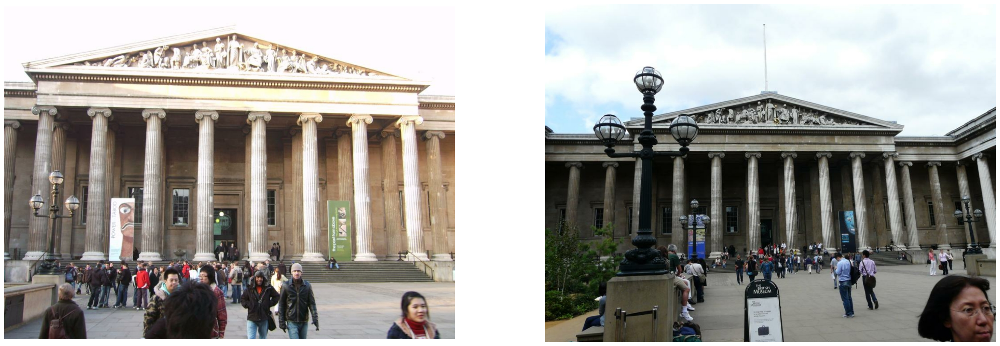

In [8]:
print(batch['filename1'], batch['filename2'])
plot_images([batch['image1'][0], batch['image2'][0]], 
            nrows=1, ncols=2, figsize=(30, 15))

# Detect keypoints, calculate descriptors and match keypoints


In [9]:
with torch.no_grad():
    if detector is not None:
        detector.eval()
    
    if descriptor is not None:
        descriptor.eval()
    
    if end_to_end is not None:
        end_to_end.eval()
    
    kp1, kp_desc1 = get_features(detector, descriptor, end_to_end, 
                                 batch['image1'], 
                                 batch['grayscale_image1'], 
                                 cfg.predict.evaluation.n)
    kp2, kp_desc2 = get_features(detector, descriptor, end_to_end, 
                                 batch['image2'], 
                                 batch['grayscale_image2'], 
                                 cfg.predict.evaluation.n)


/opt/conda/lib/python3.11/site-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/opt/conda/lib/python3.11/site-packages/torch/nn/functional.py:4373: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


In [10]:
matcher = L2Matcher()

matches = matcher.match(kp_desc1, kp_desc2, None, None)

nn_kp2 = matches.gather_nn(kp2)
match_mask1 = matches.get_match_mask(cfg.predict.evaluation.ratio_test_thr)


## Visualize keypoints

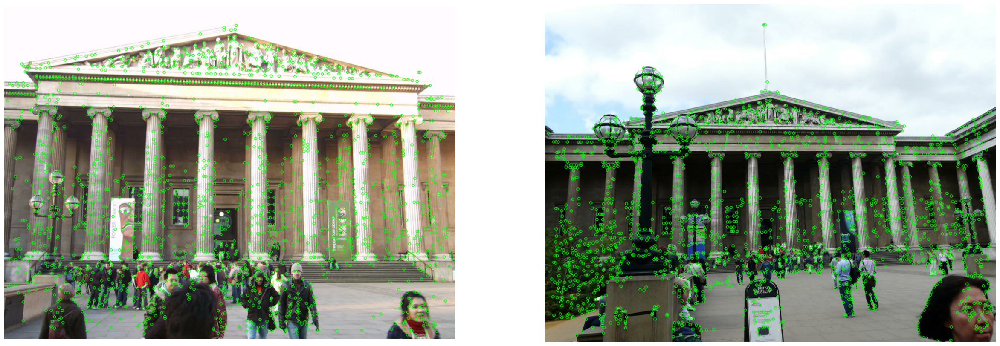

In [11]:
plot_keypoints([batch['image1'][0], batch['image2'][0]], 
               [kp1[0], kp2[0]], 
               nrows=1, ncols=2, figsize=(30, 15))

## Visualize matches

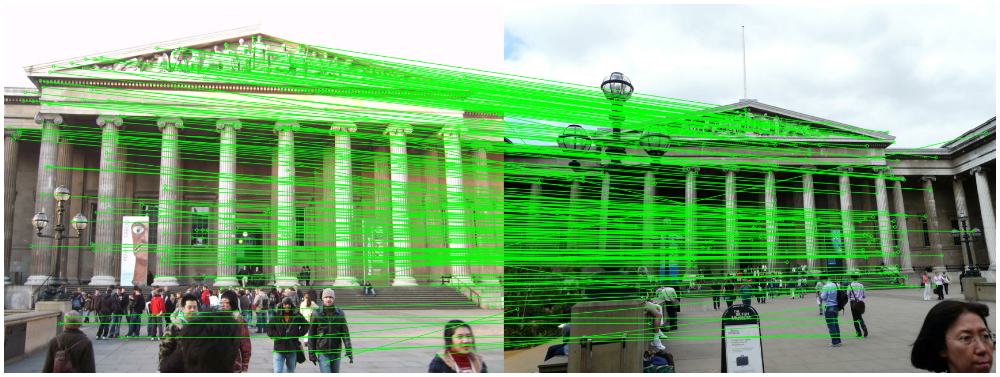

In [12]:
plot_matches(batch['image1'][0], batch['image2'][0], 
             kp1[0], nn_kp2[0], 
             match_mask1[0])

# Estimate the relative pose error

In [17]:
estimator = TwoViewGeometryEstimator.from_config(cfg.predict.evaluation.estimator)

In [18]:
rel_pose, success, inl_mask = estimator.estimate_relative_pose((kp1[0] + batch['offset1'][0]).flip(1).cpu().numpy(),
                                                               (nn_kp2[0] + batch['offset2'][0]).flip(1).cpu().numpy(),
                                                               match_mask1[0].cpu().numpy(),
                                                               batch['intrinsics1'][0].cpu().numpy(), 
                                                               batch['intrinsics2'][0].cpu().numpy())


In [ ]:
import pydegensac
pydegensac.findFundamentalMatrix((kp1[0] + batch['offset1'][0]).flip(1).cpu().numpy()[match_mask1[0].cpu().numpy()],
                                 (nn_kp2[0] + batch['offset2'][0]).flip(1).cpu().numpy()[match_mask1[0].cpu().numpy()],
                                 enable_degeneracy_check=False,)


(array([[-0.00000002,  0.0000008 , -0.00016767],
        [-0.00000059, -0.00000013,  0.00550148],
        [ 0.00029103, -0.00387441, -0.95539612]]),
 array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,

In [19]:
if 'extrinsics1' in batch:
    R_err, t_err = relative_pose_error_from_extrinsics(rel_pose, success, 
                                                       batch['extrinsics1'][0].cpu().numpy(), batch['extrinsics2'][0].cpu().numpy())
    
else:
    R_err, t_err = relative_pose_error(rel_pose, success, 
                                       batch['rel_pose'][0].cpu().numpy())

print(f"R_err: {R_err}, t_err: {t_err}")

R_err: 180.0, t_err: 180.0


## Visualize the inliers

Number of inliers: 0


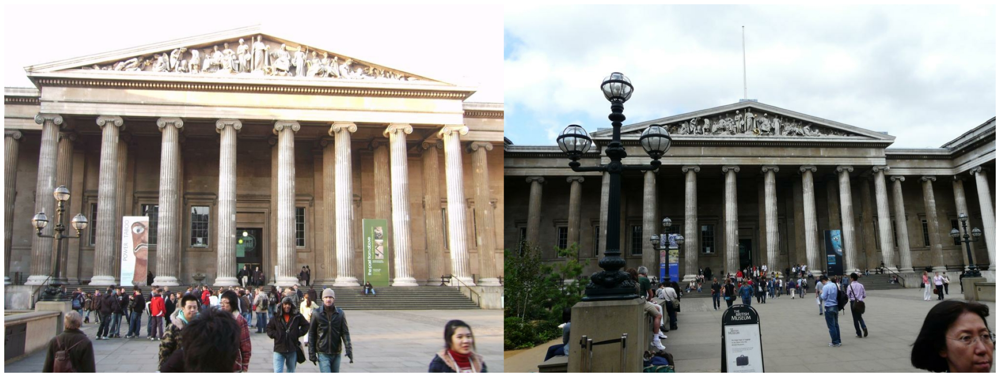

In [16]:
print("Number of inliers:", inl_mask.sum())
plot_matches(batch['image1'][0], batch['image2'][0], kp1[match_mask1], nn_kp2[match_mask1], inl_mask)